In [1]:
import math
import torch
import pickle
import torch.cuda
import torchvision.transforms as transforms
import torch.utils.data as data
import torchvision.datasets as dsets
import os
from utils.BBBConvmodel import BBBAlexNet, BBBLeNet, BBB3Conv3FC, BBBVGG16, BBBVGG19
from utils.BBBlayers import GaussianVariationalInference
import numpy as np
from scipy.stats import norm, cauchy
cuda = torch.cuda.is_available()
import pandas as pd
from matplotlib import pyplot as plt
import scipy
from scipy import stats
from scipy.optimize import minimize
import math
import io
import gzip
import bz2
import lzma

In [2]:
batch_size = 32
lr = 0.001
dataset = 'CIFAR-10'
network = 'lenet'
epoch = 50
net = BBBLeNet
num_samples = 10
beta_type = "Blundell"

In [3]:
# dimensions of input and output
if dataset == 'MNIST':    # train with MNIST
    outputs = 10
    inputs = 1
elif dataset == 'CIFAR-10':  # train with CIFAR-10
    outputs = 10
    inputs = 3
elif dataset == 'CIFAR-100':    # train with CIFAR-100
    outputs = 100
    inputs = 3

if net == BBBLeNet or BBB3Conv3FC:
    resize = 32
elif net == BBBAlexNet:
    resize = 227

if network == "lenet":
    if epoch != 50:
        model = torch.load("../results/{}_b{}_lr{}epoch{}_{}.pth".format(network, batch_size, lr, epoch, dataset))
    else:
        model = torch.load("../results/{}_b{}_lr{}_{}.pth".format(network, batch_size, lr, dataset))
elif network == "vgg19":
    model = BBBVGG19(outputs, inputs)
    model.load_state_dict(torch.load("../results/NormAddbiasVarBias_{}_modelvgg19_withbias_param_epoch100_lr0.001_bs64.pkl".format(dataset)))

In [4]:
'''
LOADING DATASET
'''

if dataset == 'MNIST':
    transform = transforms.Compose([transforms.Resize((resize, resize)), transforms.ToTensor(),
                                    transforms.Normalize((0.1307,), (0.3081,))])
    train_dataset = dsets.MNIST(root="data", download=True, transform=transform)
    val_dataset = dsets.MNIST(root="data", download=True, train=False, transform=transform)

elif dataset == 'CIFAR-100':
    transform = transforms.Compose([transforms.Resize((resize, resize)), transforms.ToTensor(),
                                    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))])
    train_dataset = dsets.CIFAR100(root="data", download=True, transform=transform)
    val_dataset = dsets.CIFAR100(root='data', download=True, train=False, transform=transform)

elif dataset == 'CIFAR-10':
    transform = transforms.Compose([transforms.Resize((resize, resize)), transforms.ToTensor(),
                                    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))])
    train_dataset = dsets.CIFAR10(root="data", download=True, transform=transform)
    val_dataset = dsets.CIFAR10(root='data', download=True, train=False, transform=transform)

Files already downloaded and verified
Files already downloaded and verified


In [5]:
loader_val = data.DataLoader(dataset=val_dataset, batch_size=batch_size, shuffle=False)

In [6]:
model.state_dict().keys()

odict_keys(['conv1.qw_mean', 'conv1.qw_logvar', 'conv1.qb_mean', 'conv1.qb_logvar', 'conv1.conv_qw_mean', 'conv1.conv_qw_si', 'conv1.log_alpha', 'conv2.qw_mean', 'conv2.qw_logvar', 'conv2.qb_mean', 'conv2.qb_logvar', 'conv2.conv_qw_mean', 'conv2.conv_qw_si', 'conv2.log_alpha', 'fc1.qw_mean', 'fc1.qw_logvar', 'fc1.qb_mean', 'fc1.qb_logvar', 'fc1.fc_qw_mean', 'fc1.fc_qw_si', 'fc1.log_alpha', 'fc2.qw_mean', 'fc2.qw_logvar', 'fc2.qb_mean', 'fc2.qb_logvar', 'fc2.fc_qw_mean', 'fc2.fc_qw_si', 'fc2.log_alpha', 'fc3.qw_mean', 'fc3.qw_logvar', 'fc3.qb_mean', 'fc3.qb_logvar', 'fc3.fc_qw_mean', 'fc3.fc_qw_si', 'fc3.log_alpha', 'layers.0.qw_mean', 'layers.0.qw_logvar', 'layers.0.qb_mean', 'layers.0.qb_logvar', 'layers.0.conv_qw_mean', 'layers.0.conv_qw_si', 'layers.0.log_alpha', 'layers.3.qw_mean', 'layers.3.qw_logvar', 'layers.3.qb_mean', 'layers.3.qb_logvar', 'layers.3.conv_qw_mean', 'layers.3.conv_qw_si', 'layers.3.log_alpha', 'layers.7.qw_mean', 'layers.7.qw_logvar', 'layers.7.qb_mean', 'layers

# 合并weights

In [7]:
model = model.cpu()
if network == "lenet" or network == "lenet5":
    depths = [0, 3, 7, 9, 11]
elif network == "vgg16":
    depths = [0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 27, 30, 33]
elif network == "vgg19":
    depths = [0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26,28,30,33,36,39] # VGG19
w_name = ['layers.{}.qw_'.format(depth) for depth in depths]
b_name = ['layers.{}.qb_'.format(depth) for depth in depths]
whole_w = []
for (i, j) in zip(w_name, b_name):
    whole_w.append(model.state_dict()['{}mean'.format(i)].numpy().ravel())
    whole_w.append(model.state_dict()['{}mean'.format(j)].numpy().ravel())
whole_w = np.concatenate(whole_w)
print(len(whole_w))
print(len(whole_w[np.abs(whole_w) <= 1e-2]))

62006
7562


# 神经网络精度计算函数

In [8]:
vi = GaussianVariationalInference(torch.nn.CrossEntropyLoss())

def run_epoch(loader, epoch, is_training=False, model=model):
    m = math.ceil(len(loader.dataset) / loader.batch_size)

    accuracies = []
    likelihoods = []
    kls = []
    losses = []

    for i, (images, labels) in enumerate(loader):
        # # Repeat samples (Casper's trick)
        # x = images.view(-1, inputs, resize, resize).repeat(num_samples, 1, 1, 1)
        # y = labels.repeat(num_samples)
        x = images.view(-1, inputs, resize, resize)
        y = labels
        if cuda:
            x = x.cuda()
            y = y.cuda()

        if beta_type == "Blundell":
            beta = 2 ** (m - (i + 1)) / (2 ** m - 1)
        elif beta_type == "Soenderby":
            beta = min(epoch / (num_epochs//4), 1)
        elif beta_type == "Standard":
            beta = 1 / m
        else:
            beta = 0

        logits, kl = model.probforward(x)
        loss = vi(logits, y, kl, beta)
        ll = -loss.data.mean() + beta*kl.data.mean()

        if is_training:
            optimiser.zero_grad()
            loss.backward()
            optimiser.step()

        _, predicted = logits.max(1)
        accuracy = (predicted.data.cpu() == y.cpu()).float().mean()

        accuracies.append(accuracy)
        losses.append(loss.data.mean())
        kls.append(beta*kl.data.mean())
        likelihoods.append(ll)

    diagnostics = {'loss': sum(losses)/len(losses),
                   'acc': sum(accuracies)/len(accuracies),
                   'kl': sum(kls)/len(kls),
                   'likelihood': sum(likelihoods)/len(likelihoods)}

    return diagnostics

In [9]:
model = model.cuda()
diagnostics_val = run_epoch(loader_val, epoch=1)

logits tensor([[-2.4727e+00, -4.0233e+00,  4.1621e-01,  3.7228e+00, -2.1261e+00,
          3.1294e+00,  1.0448e+00, -5.3220e-02, -5.1172e-01, -3.0499e+00],
        [ 4.1084e+00,  3.6313e+00, -1.8169e+00, -4.9150e+00, -4.1787e+00,
         -5.2253e+00, -6.0209e+00, -5.6141e+00,  7.5372e+00,  1.3263e+00],
        [ 2.3457e+00,  2.2617e+00, -1.5517e+00, -2.1629e+00, -3.4942e+00,
         -2.8119e+00, -4.2176e+00, -2.1796e+00,  3.2710e+00,  1.3767e+00],
        [ 4.7766e+00, -8.7941e-02,  2.1123e+00, -1.9020e+00, -2.0155e+00,
         -3.4521e+00, -2.9706e+00, -5.8343e+00,  4.7648e+00, -1.4825e+00],
        [-4.0196e+00, -3.6241e+00,  9.2314e-01,  1.8764e+00,  3.4540e+00,
          1.6944e+00,  2.0265e+00, -9.0864e-01, -4.4377e+00, -3.4561e+00],
        [-1.1685e+00, -4.3931e+00,  1.0199e+00,  1.1438e+00,  4.1193e-01,
          1.2164e+00,  3.5282e+00,  1.2271e-01, -5.1418e+00, -3.1255e+00],
        [ 1.0016e+00,  3.1584e+00,  6.0718e-01,  7.5094e-01, -4.4607e+00,
          6.3643e-01, -1.

In [10]:
diagnostics_val

{'loss': tensor(309.4410, device='cuda:0'),
 'acc': tensor(0.6046),
 'kl': tensor(308.3026, device='cuda:0'),
 'likelihood': tensor(-1.1384, device='cuda:0')}

In [11]:
def evaluate(loader, cpr_model, epoch=1):
    m = math.ceil(len(loader.dataset) / loader.batch_size)

    accuracies = []

    for i, (images, labels) in enumerate(loader):
        # # Repeat samples (Casper's trick)
        # x = images.view(-1, inputs, resize, resize).repeat(num_samples, 1, 1, 1)
        # y = labels.repeat(num_samples)

        x = images.view(-1, inputs, resize, resize)
        y = labels

        if cuda:
            x = x.cuda()
            y = y.cuda()

        logits = cpr_model(x)
        _, predicted = torch.max(logits.data, 1)
        accuracy = (predicted.data.cpu() == y.cpu()).float().mean()

        accuracies.append(accuracy)

    diagnostics = {'acc': sum(accuracies)/len(accuracies)}

    return diagnostics

把BNN的weights套进确定性网络，测试精度

In [12]:
model = model.cpu()
if network != "vgg19":
    uncompressed_list = []
    for (i, j) in zip(w_name, b_name):
        # w
        vecs_u1 = model.state_dict()['{}mean'.format(i)]
        uncompressed_list.append(vecs_u1)
        # b
        vecs_u2 = model.state_dict()['{}mean'.format(j)]
        uncompressed_list.append(vecs_u2)

    if network == "lenet":
        # lenet
        from model import lenet
        cpr_model=lenet(inputs)
    elif network == "vgg16":
        from model import VGG16
        cpr_model = VGG16(inputs)
    name_uncpr=cpr_model.state_dict().keys()
    uncpr_state_dict = dict(zip(name_uncpr, uncompressed_list))
    cpr_model.load_state_dict(uncpr_state_dict)
    # 用压缩后的模型计算loss，acc等
    cpr_model = cpr_model.cuda()
    diagnostics_uncpr_val = evaluate(loader_val, cpr_model=cpr_model)

else:
    para_dict = model.state_dict()
    uncompressed_list = []
    for i in depths:
        for j in ['w','b']:
            vecs_u = model.state_dict()['layers.{}.q{}_mean'.format(i,j)]
            uncompressed_list.append(vecs_u)
        if i < 33:
            temp2 = para_dict['layers.{}.1.weight'.format(i+1)]
            uncompressed_list.append(temp2)
            temp3 = para_dict['layers.{}.1.bias'.format(i+1)]
            uncompressed_list.append(temp3)
            temp4 = para_dict['layers.{}.1.running_mean'.format(i+1)]
            uncompressed_list.append(temp4)
            temp5 = para_dict['layers.{}.1.running_var'.format(i+1)]
            uncompressed_list.append(temp5)
            temp6 = para_dict['layers.{}.1.num_batches_tracked'.format(i+1)]
            uncompressed_list.append(temp6)

    from model import VGG19
    cpr_model=VGG19(inputs = inputs,outputs=outputs)
    name_uncpr=cpr_model.state_dict().keys()
    cpr_state_dict = dict(zip(name_uncpr, uncompressed_list))
    cpr_model.load_state_dict(cpr_state_dict)
    cpr_model = cpr_model.cuda()
    diagnostics_uncpr_val = evaluate(loader_val, cpr_model=cpr_model)

In [13]:
diagnostics_uncpr_val

{'acc': tensor(0.5853)}

## baseline

In [31]:
def quantize_coordinates(means, quantization_max, scale):
    quantized_scaled = np.round(np.clip(
        scale * means, -quantization_max, quantization_max))
    return quantized_scaled

In [32]:
model = model.cpu()

In [39]:

def test_quantization(quantization_max, strategy):
    print('quantization_max=%d' % quantization_max)

    print('  Getting accuracy ...')
    compressed_list = []
    quantized = []
    for (i, j) in zip(w_name, b_name):
        # w
        vecs_u1 = model.state_dict()['{}mean'.format(i)].numpy()
        # b
        vecs_u2 = model.state_dict()['{}mean'.format(j)].numpy()

        if strategy == "global": #global: 用whole_w计算量化参数
            scale = (quantization_max + 0.5) / np.abs(whole_w).max()
        elif strategy == "layer-wise":
            # 先把w和b合并在一起用于计算量化参数
            vecs_u = np.concatenate([vecs_u1.ravel(), vecs_u2.ravel()])
            scale = (quantization_max + 0.5) / np.abs(vecs_u).max()

        quantized1 = quantize_coordinates(vecs_u1, quantization_max, scale)
        quantized.append(quantized1.flatten())
        compressed1 = quantized1 / scale
        compressed1 = torch.from_numpy(compressed1)
        compressed_list.append(compressed1)

        quantized2 = quantize_coordinates(vecs_u2, quantization_max, scale)
        quantized.append(quantized2.flatten())
        compressed2 = quantized2 / scale
        compressed2 = torch.from_numpy(compressed2)
        compressed_list.append(compressed2)

    if network == "lenet" or network == "lenet5":
        # lenet
        from model import lenet
        cpr_model=lenet(inputs)
    elif network == "vgg16":
        from model import VGG16
        cpr_model = VGG16(inputs)
    name_cpr=cpr_model.state_dict().keys()
    cpr_state_dict = dict(zip(name_cpr, compressed_list))
    cpr_model.load_state_dict(cpr_state_dict)
    # 用压缩后的模型计算loss，acc等
    cpr_model = cpr_model.cuda()
    diagnostics_cpr_val = evaluate(loader_val, cpr_model=cpr_model)
    acc = diagnostics_cpr_val['acc'].numpy()
    print('acc:', acc)
    
    quantized = np.concatenate(quantized)
    print('  Getting entropy ...')
    compressed_bitlength = empirical_entropy(quantized)

    print('  Converting to bytes ...')
    if quantization_max <= 127:
        quantized_bytes = quantized.astype(np.int8)
    else:
        quantized_bytes = quantized.astype(np.int16)

    print('  Gzipping ...')
    buf = io.BytesIO()
    gz = gzip.GzipFile(fileobj=buf, mode="wb", compresslevel=9)
    gz.write(bytes(quantized_bytes.data))
    gz.flush()
    gz.close()
    buf.flush()
    gzip_bitlength = len(buf.getbuffer()) * 8

    print('  Bzip2 ...')
    buf = io.BytesIO()
    bz = bz2.BZ2File(buf, mode="wb", compresslevel=9)
    bz.write(bytes(quantized_bytes.data))
    bz.flush()
    bz.close()
    buf.flush()
    bz2_bitlength = len(buf.getbuffer()) * 8

    print('  Lzma ...')
    buf = io.BytesIO()
    lz = lzma.LZMAFile(buf, mode="wb", preset=9, format=lzma.FORMAT_ALONE)
    lz.write(bytes(quantized_bytes.data))
    lz.flush()
    lz.close()
    buf.flush()
    lzma_bitlength = len(buf.getbuffer()) * 8

    print('  entropy        = %d' % compressed_bitlength)
    print('  gzip_bitlength = %d' % gzip_bitlength)
    print('  bz2_bitlength  = %d' % bz2_bitlength)
    print('  lzma_bitlength = %d' % lzma_bitlength)

    return acc, compressed_bitlength, gzip_bitlength, bz2_bitlength, lzma_bitlength, compressed_list

In [35]:
strategy = "global"

In [40]:
# quantizations = [1023, 511, 255, 127, 63, 31, 15, 7, 3, 2, 1]
quantizations = list(range(1, 10)) + [int(round(i)) for i in np.exp(np.linspace(np.log(10), np.log(1023), 50))]
mrrs_and_bitlengths_baseline = np.array([
    test_quantization(q, strategy) for q in quantizations])

quantization_max=1
  Getting accuracy ...
acc: 0.10003994
  Getting entropy ...
  Converting to bytes ...
  Gzipping ...
  Bzip2 ...
  Lzma ...
  entropy        = 198
  gzip_bitlength = 1056
  bz2_bitlength  = 624
  lzma_bitlength = 1032
quantization_max=2
  Getting accuracy ...
acc: 0.09984025
  Getting entropy ...
  Converting to bytes ...
  Gzipping ...
  Bzip2 ...
  Lzma ...
  entropy        = 729
  gzip_bitlength = 1520
  bz2_bitlength  = 1024
  lzma_bitlength = 1488
quantization_max=3
  Getting accuracy ...
acc: 0.10063898
  Getting entropy ...
  Converting to bytes ...
  Gzipping ...
  Bzip2 ...
  Lzma ...
  entropy        = 1777
  gzip_bitlength = 2576
  bz2_bitlength  = 2120
  lzma_bitlength = 2864
quantization_max=4
  Getting accuracy ...
acc: 0.14736421
  Getting entropy ...
  Converting to bytes ...
  Gzipping ...
  Bzip2 ...
  Lzma ...
  entropy        = 5147
  gzip_bitlength = 6904
  bz2_bitlength  = 6984
  lzma_bitlength = 8600
quantization_max=5
  Getting accuracy ...
a

/home/xueqiong/anaconda3/envs/pytorch/lib/python3.6/site-packages/ipykernel_launcher.py:4: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  after removing the cwd from sys.path.


咋回事啊这是

uncompressed_list: 压缩前的参数

mrrs_and_bitlengths[:,-1]：VBQ压缩后的

mrrs_and_bitlengths_baseline[:, -1]：uniform压缩后的

In [72]:

mrrs_and_bitlengths_list = []
# for method in ["gaussian", "gg", "gmm", "cauchy"]:
for method in ["gaussian"]:
    def compress_coordinates(means, stds, lamb, bitlengths, codepoints):
        # N = len(means.ravel()) = len(stds.ravel())
        # C = len(codepoints)
        optima = np.empty_like(means)
        optima_lengths = np.empty_like(means, dtype=int)
        for i in range(0, 10000000, 100000):
            if i % 100000 == 0:
                print(i / 1000000)
            squared_errors = (codepoints[np.newaxis, :] - means.ravel()[i:i+100000, np.newaxis])**2
                # shape (N, C)
            weighted_penalties = (2 * lamb) * stds.ravel()[i:i+100000, np.newaxis]**2 * bitlengths[np.newaxis, :]
                # shape (N, C)
            optima_idxs = np.argmin(squared_errors + weighted_penalties, axis=1)
            optima.ravel()[i:i+100000] = codepoints[optima_idxs]
            optima_lengths.ravel()[i:i+100000] = bitlengths[optima_idxs]
        return optima, optima_lengths

    if method == "gaussian":
        # gaussian
        empirical_mean = np.mean(whole_w)
        empirical_std = np.std(whole_w)

    elif method == "gg":
        # generalized gaussian
        def generalized_gaussian(params, data):
            beta, mu, alpha = params
            n = len(data)
            # log_likelihood = -n*np.log(2*alpha*math.gamma(1/beta)) - np.sum(np.abs((data - mu)/(np.sqrt(2)*alpha))**beta)
            log_likelihood = n*(np.log(beta)-np.log(2)-np.log(alpha)-np.log(math.gamma(1/beta)))-np.sum((np.abs(data - mu)/alpha)**beta)
            return -log_likelihood

        def estimate_generalized_gaussian_parameters(data):
            # Initial parameter guess
            initial_params = [1, np.mean(data), np.std(data)]

            # Define the optimization function
            optimization_func = lambda params: generalized_gaussian(params, data)

            # Perform the optimization
            result = minimize(optimization_func, initial_params, method='Nelder-Mead')

            # Extract the optimized parameters
            beta, mu, alpha = result.x

            return beta, mu, alpha
        beta_est, mu_est, alpha_est = estimate_generalized_gaussian_parameters(whole_w)

        def log_GGD_pdf (mu,alpha,beta,x):
            return np.log(beta)-np.log(2)-np.log(alpha)-np.log(math.gamma(1/beta))-np.sum(np.abs((x - mu)/alpha)**beta)
        def quantile_GGD(alpha,beta,mu,p):
            return np.sign(p-0.5)*((alpha**beta)*stats.gamma.ppf(2*np.abs(p-0.5),1/beta))**(1/beta)+mu
    elif method == "gmm":
        import random
        from sklearn.mixture import GaussianMixture
        import scipy.optimize as optimize
        # gmm
        # 设置随机种子
        seed = 42
        np.random.seed(seed)
        random.seed(seed)

        # 定义要尝试的n_components值
        n_min = 2
        n_components_range = range(n_min, 10)

        # 初始化信息准则列表
        # aic_scores = []
        bic_scores = []

        # 计算每个n_components值上的信息准则值
        for n_components in n_components_range:
            gmm = GaussianMixture(n_components=n_components)
            gmm.fit(whole_w.reshape(-1,1))
            # aic_scores.append(gmm.aic(whole_w.reshape(-1,1)))
            bic_scores.append(gmm.bic(whole_w.reshape(-1,1)))

        # 选择具有最小信息准则值的n_components值
        # best_n_components_aic = np.argmin(aic_scores) + n_min
        best_n_components_bic = np.argmin(bic_scores) + n_min

        # print("Best n_components (AIC):", best_n_components_aic)
        print("Best n_components (BIC):", best_n_components_bic)

        gmm = GaussianMixture(n_components=best_n_components_bic)
        gmm.fit(whole_w.reshape(-1,1))

        # 获取每个混合分量的参数（均值、标准差、权重）
        means = gmm.means_.squeeze()
        covs = gmm.covariances_.squeeze()  #注意covs是方差，不是标准差
        pis = gmm.weights_.squeeze()
        def F(x, w, u, s):
            return sum(w * norm.cdf(x, loc=u, scale=s))

        def F_inv(p, w, u, s, br=(-1000, 1000)):
            G = lambda x: F(x, w, u, s) - p
            result = optimize.root_scalar(G, bracket=br)
            return result.root
    elif method == "cauchy":
        # cauchy
        cauchy_loc, cauchy_scale = cauchy.fit(whole_w)

    from collections import Counter
    def empirical_entropy(values):
        counts = np.array(list(Counter(values.ravel()).values()))
        total_counts = counts.sum()
        return total_counts * np.log2(total_counts) - counts.dot(np.log2(counts))

    model = model.cpu()
    def compress_model(lamb, strategy, max_codepoint_length=10):
        compressed_add_len = 0
        compressed_list = []
        cpr_len_list = []
        quantized = []
        for depth in depths:
            i = 'layers.{}.qw_'.format(depth)
            j = 'layers.{}.qb_'.format(depth)
            # w
            vecs_u1 = model.state_dict()['{}mean'.format(i)].numpy()
            stds_u1 = np.exp(model.state_dict()['{}logvar'.format(i)].numpy())
            # b
            vecs_u2 = model.state_dict()['{}mean'.format(j)].numpy()
            stds_u2 = np.exp(model.state_dict()['{}logvar'.format(j)].numpy())

            if strategy == "global":
                if method == "gaussian":
                    global empirical_mean, empirical_std
                    codepoints_and_lengths = [
                        (scipy.stats.norm.ppf(codepoint_xi, loc=empirical_mean, scale=empirical_std), length)
                        for length in range(max_codepoint_length+1)
                        for codepoint_xi in np.arange(0.5**(length+1), 1, 0.5**length)
                    ]
                elif method == "gg":
                    global alpha_est,beta_est,mu_est
                    codepoints_and_lengths = [
                        (quantile_GGD(alpha_est,beta_est,mu_est,codepoint_xi), length)
                        for length in range(max_codepoint_length+1)
                        for codepoint_xi in np.arange(0.5**(length+1), 1, 0.5**length)
                    ]
                elif method == "gmm":
                    global pis, means, covs
                    codepoints_and_lengths = [
                        (F_inv(codepoint_xi, pis, means, np.sqrt(covs)), length)
                        for length in range(max_codepoint_length+1)
                        for codepoint_xi in np.arange(0.5**(length+1), 1, 0.5**length)
                    ]
                elif method == "cauchy":
                    global cauchy_loc, cauchy_scale
                    codepoints_and_lengths = [
                        (scipy.stats.cauchy.ppf(codepoint_xi, loc=cauchy_loc, scale=cauchy_scale), length)
                        for length in range(max_codepoint_length+1)
                        for codepoint_xi in np.arange(0.5**(length+1), 1, 0.5**length)
                    ]
                else:
                    print('method not found!')
                    break
            if strategy == "layer-wise":
                # 先把w和b合并在一起再拟合
                vecs_u = np.concatenate([vecs_u1.ravel(), vecs_u2.ravel()])
                if method == "gaussian":
                    empirical_mean = np.mean(vecs_u)
                    empirical_std = np.std(vecs_u)
                    codepoints_and_lengths = [
                        (scipy.stats.norm.ppf(codepoint_xi, loc=empirical_mean, scale=empirical_std), length)
                        for length in range(max_codepoint_length+1)
                        for codepoint_xi in np.arange(0.5**(length+1), 1, 0.5**length)
                    ]
                elif method == "gg":
                    beta_est, mu_est, alpha_est = estimate_generalized_gaussian_parameters(vecs_u)
                    codepoints_and_lengths = [
                        (quantile_GGD(alpha_est,beta_est,mu_est,codepoint_xi), length)
                        for length in range(max_codepoint_length+1)
                        for codepoint_xi in np.arange(0.5**(length+1), 1, 0.5**length)
                    ]
                elif method == "gmm":
                    # 拟合gmm
                    # 定义要尝试的n_components值
                    n_min = 2
                    n_components_range = range(n_min, 6)

                    # 初始化信息准则列表
                    bic_scores = []

                    # 计算每个n_components值上的信息准则值
                    for n_components in n_components_range:
                        gmm = GaussianMixture(n_components=n_components)
                        gmm.fit(vecs_u.reshape(-1,1))
                        # aic_scores.append(gmm.aic(vecs_u.reshape(-1,1)))
                        bic_scores.append(gmm.bic(vecs_u.reshape(-1,1)))

                    # 选择具有最小信息准则值的n_components值
                    # best_n_components_aic = np.argmin(aic_scores) + n_min
                    best_n_components_bic = np.argmin(bic_scores) + n_min

                    # print("Best n_components (AIC):", best_n_components_aic)
                    print("Best n_components (BIC):", best_n_components_bic)

                    gmm = GaussianMixture(n_components=best_n_components_bic)
                    gmm.fit(vecs_u.reshape(-1,1))

                    # 获取每个混合分量的参数（均值、标准差、权重）
                    means = gmm.means_.squeeze()
                    covs = gmm.covariances_.squeeze()  #注意covs是方差，不是标准差
                    pis = gmm.weights_.squeeze()

                    codepoints_and_lengths = [
                        (F_inv(codepoint_xi, pis, means, np.sqrt(covs)), length)
                        for length in range(max_codepoint_length+1)
                        for codepoint_xi in np.arange(0.5**(length+1), 1, 0.5**length)
                    ]
                elif method == "cauchy":
                    cauchy_loc, cauchy_scale = cauchy.fit(vecs_u.ravel())
                    codepoints_and_lengths = [
                        (scipy.stats.cauchy.ppf(codepoint_xi, loc=cauchy_loc, scale=cauchy_scale), length)
                        for length in range(max_codepoint_length+1)
                        for codepoint_xi in np.arange(0.5**(length+1), 1, 0.5**length)
                    ]
                else:
                    print("method not found!")
                    break
            codepoints = np.array([codepoint for codepoint, _ in codepoints_and_lengths])
            lengths = np.array([length for _, length in codepoints_and_lengths])
            # compress w
            compressed1, cpr_len1 = compress_coordinates(vecs_u1,stds_u1,lamb,lengths,codepoints)
            quantized.append(compressed1.flatten())
            compressed1 = torch.from_numpy(compressed1)
            compressed_list.append(compressed1)
            cpr_len_list.append(cpr_len1)
            compressed_add_len += np.sum(cpr_len1)
            # compress b
            compressed2, cpr_len2 = compress_coordinates(vecs_u2,stds_u2,lamb,lengths,codepoints)
            quantized.append(compressed2.flatten())
            compressed2 = torch.from_numpy(compressed2)
            compressed_list.append(compressed2)
            cpr_len_list.append(cpr_len2)
            compressed_add_len += np.sum(cpr_len2)
            
            #如果是vgg，还要把normalization层的参数加入（目前是不压缩，后续可尝试均匀量化方法压缩）
            if network == "vgg19" and depth < 33:
                temp2 = para_dict['layers.{}.1.weight'.format(depth+1)]
                compressed_list.append(temp2)
                temp3 = para_dict['layers.{}.1.bias'.format(depth+1)]
                compressed_list.append(temp3)
                temp4 = para_dict['layers.{}.1.running_mean'.format(depth+1)]
                compressed_list.append(temp4)
                temp5 = para_dict['layers.{}.1.running_var'.format(depth+1)]
                compressed_list.append(temp5)
                temp6 = para_dict['layers.{}.1.num_batches_tracked'.format(depth+1)]
                compressed_list.append(temp6)

        if network == "lenet":
            # lenet
            from model import lenet
            cpr_model=lenet(inputs)
        elif network == "vgg16":
            from model import VGG16
            cpr_model = VGG16(inputs)
        elif network == "vgg19":
            from model import VGG19
            cpr_model = VGG19(inputs=inputs, outputs=outputs)
        name_cpr=cpr_model.state_dict().keys()
        cpr_state_dict = dict(zip(name_cpr, compressed_list))
        cpr_model.load_state_dict(cpr_state_dict)
        # 用压缩后的模型计算loss，acc等
        cpr_model = cpr_model.cuda()
        diagnostics_cpr_val = evaluate(loader_val, cpr_model=cpr_model)
        acc = diagnostics_cpr_val['acc'].numpy()
        # 计算compressed_AC_len
        quantized = np.concatenate(quantized)
        # AC coding
        print('  AC coding...')
        compressed_AC_len = empirical_entropy(quantized)
        # compressed_AC_len是最后用AC再编码，compressed_add_len是直接叠加

        # 获取唯一的标签值
        unique_labels = np.unique(quantized)
        # 构建标签映射字典
        label_map = {label: i for i, label in enumerate(unique_labels)}
        # 进行整数编码
        encoded_labels = np.array([label_map[label] for label in quantized])
        encoded_labels = encoded_labels - int(encoded_labels.max()/2)  # 以0为中心分布

        print('  Converting to bytes ...')
        if np.abs(encoded_labels).max() <= 127:
            quantized_bytes = encoded_labels.astype(np.int8)
        else:
            quantized_bytes = encoded_labels.astype(np.int16)

        print('  Gzipping ...')
        buf = io.BytesIO()
        gz = gzip.GzipFile(fileobj=buf, mode="wb", compresslevel=9)
        gz.write(bytes(quantized_bytes.data))
        gz.flush()
        gz.close()
        buf.flush()
        gzip_bitlength = len(buf.getbuffer()) * 8

        print('  Bzip2 ...')
        buf = io.BytesIO()
        bz = bz2.BZ2File(buf, mode="wb", compresslevel=9)
        bz.write(bytes(quantized_bytes.data))
        bz.flush()
        bz.close()
        buf.flush()
        bz2_bitlength = len(buf.getbuffer()) * 8

        print('  Lzma ...')
        buf = io.BytesIO()
        lz = lzma.LZMAFile(buf, mode="wb", preset=9, format=lzma.FORMAT_ALONE)
        lz.write(bytes(quantized_bytes.data))
        lz.flush()
        lz.close()
        buf.flush()
        lzma_bitlength = len(buf.getbuffer()) * 8

        # compressed_AC_len是最后用AC再编码，compressed_add_len是直接叠加
        print("lamb=", lamb, "max_codepoint_length", max_codepoint_length, "strategy=", strategy)
        print("acc=",acc)
        print("compressed_AC_len",compressed_AC_len)
        print("compressed_gzip_len",gzip_bitlength)
        print("compressed_bzip2_len",bz2_bitlength)
        print("compressed_lzma_len",lzma_bitlength)
        print("compressed_add_len",compressed_add_len)
        return acc, compressed_AC_len, gzip_bitlength, bz2_bitlength, lzma_bitlength, compressed_add_len, compressed_list

    strategy = "global"

    # # 画acc-bits图

    lambs = np.exp(np.linspace(np.log(0.0001), np.log(10000), 50))
    mrrs_and_bitlengths = np.array([[compress_model(lamb, strategy, N) for lamb in lambs] for N in range(10)])
    mrrs_and_bitlengths_list.append(mrrs_and_bitlengths)

0.0
0.1
0.2
0.3
0.4
0.5
0.6
0.7
0.8
0.9
1.0
1.1
1.2
1.3
1.4
1.5
1.6
1.7
1.8
1.9
2.0
2.1
2.2
2.3
2.4
2.5
2.6
2.7
2.8
2.9
3.0
3.1
3.2
3.3
3.4
3.5
3.6
3.7
3.8
3.9
4.0
4.1
4.2
4.3
4.4
4.5
4.6
4.7
4.8
4.9
5.0
5.1
5.2
5.3
5.4
5.5
5.6
5.7
5.8
5.9
6.0
6.1
6.2
6.3
6.4
6.5
6.6
6.7
6.8
6.9
7.0
7.1
7.2
7.3
7.4
7.5
7.6
7.7
7.8
7.9
8.0
8.1
8.2
8.3
8.4
8.5
8.6
8.7
8.8
8.9
9.0
9.1
9.2
9.3
9.4
9.5
9.6
9.7
9.8
9.9
0.0
0.1
0.2
0.3
0.4
0.5
0.6
0.7
0.8
0.9
1.0
1.1
1.2
1.3
1.4
1.5
1.6
1.7
1.8
1.9
2.0
2.1
2.2
2.3
2.4
2.5
2.6
2.7
2.8
2.9
3.0
3.1
3.2
3.3
3.4
3.5
3.6
3.7
3.8
3.9
4.0
4.1
4.2
4.3
4.4
4.5
4.6
4.7
4.8
4.9
5.0
5.1
5.2
5.3
5.4
5.5
5.6
5.7
5.8
5.9
6.0
6.1
6.2
6.3
6.4
6.5
6.6
6.7
6.8
6.9
7.0
7.1
7.2
7.3
7.4
7.5
7.6
7.7
7.8
7.9
8.0
8.1
8.2
8.3
8.4
8.5
8.6
8.7
8.8
8.9
9.0
9.1
9.2
9.3
9.4
9.5
9.6
9.7
9.8
9.9
0.0
0.1
0.2
0.3
0.4
0.5
0.6
0.7
0.8
0.9
1.0
1.1
1.2
1.3
1.4
1.5
1.6
1.7
1.8
1.9
2.0
2.1
2.2
2.3
2.4
2.5
2.6
2.7
2.8
2.9
3.0
3.1
3.2
3.3
3.4
3.5
3.6
3.7
3.8
3.9
4.0
4.1
4.2
4.3
4.4
4.5
4.6
4.7
4.8
4.9


/home/xueqiong/anaconda3/envs/pytorch/lib/python3.6/site-packages/ipykernel_launcher.py:331: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


N= 0
VBQ的SSE 309.62952
VBQ的acc 0.10003994
VBQ的SSE 309.62952
VBQ的acc 0.10003994
VBQ的SSE 309.62952
VBQ的acc 0.10003994
VBQ的SSE 309.62952
VBQ的acc 0.10003994
VBQ的SSE 309.62952
VBQ的acc 0.10003994
VBQ的SSE 309.62952
VBQ的acc 0.10003994
VBQ的SSE 309.62952
VBQ的acc 0.10003994
VBQ的SSE 309.62952
VBQ的acc 0.10003994
VBQ的SSE 309.62952
VBQ的acc 0.10003994
VBQ的SSE 309.62952
VBQ的acc 0.10003994
VBQ的SSE 309.62952
VBQ的acc 0.10003994
VBQ的SSE 309.62952
VBQ的acc 0.10003994
VBQ的SSE 309.62952
VBQ的acc 0.10003994
VBQ的SSE 309.62952
VBQ的acc 0.10003994
VBQ的SSE 309.62952
VBQ的acc 0.10003994
VBQ的SSE 309.62952
VBQ的acc 0.10003994
VBQ的SSE 309.62952
VBQ的acc 0.10003994
VBQ的SSE 309.62952
VBQ的acc 0.10003994
VBQ的SSE 309.62952
VBQ的acc 0.10003994
VBQ的SSE 309.62952
VBQ的acc 0.10003994
VBQ的SSE 309.62952
VBQ的acc 0.10003994
VBQ的SSE 309.62952
VBQ的acc 0.10003994
VBQ的SSE 309.62952
VBQ的acc 0.10003994
VBQ的SSE 309.62952
VBQ的acc 0.10003994
VBQ的SSE 309.62952
VBQ的acc 0.10003994
VBQ的SSE 309.62952
VBQ的acc 0.10003994
VBQ的SSE 309.62952
VBQ的acc 0.10003

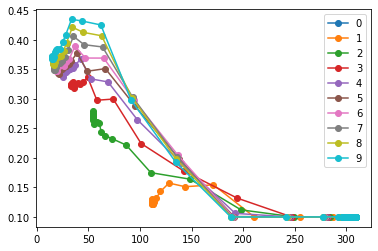

In [102]:
# VBQ的SSE

for N in range(10):
    print('N=', N)
    sse_list = []
    for i in range(len(lambs)):
        sse = np.sum(np.concatenate([(x - y).numpy().ravel() for (x,y) in zip(mrrs_and_bitlengths[N][i,-1], uncompressed_list)])**2)
        sse_list.append(sse)
        print('VBQ的SSE', sse)
        print('VBQ的acc', mrrs_and_bitlengths[N][i,0])
    plt.plot(sse_list, mrrs_and_bitlengths[N][:,0], '-o', label=N)
plt.legend()
plt.show()

In [104]:
mrrs_and_bitlengths_list[-1][1]

array([[array(0.12809505, dtype=float32), 97749.78901689406, 119792,
        112664, 111104, 44466,
        list([tensor([[[[-4.7623e-02, -4.7623e-02, -4.7623e-02, -4.7623e-02,  4.7702e-02],
          [-4.7623e-02, -4.7623e-02, -4.7623e-02, -4.7623e-02,  3.9598e-05],
          [ 4.7702e-02,  3.9598e-05,  4.7702e-02,  4.7702e-02,  4.7702e-02],
          [ 4.7702e-02,  4.7702e-02,  4.7702e-02,  4.7702e-02,  3.9598e-05],
          [ 4.7702e-02,  4.7702e-02,  4.7702e-02,  4.7702e-02,  4.7702e-02]],

         [[-4.7623e-02, -4.7623e-02, -4.7623e-02, -4.7623e-02,  4.7702e-02],
          [-4.7623e-02, -4.7623e-02, -4.7623e-02,  4.7702e-02,  3.9598e-05],
          [-4.7623e-02,  4.7702e-02,  3.9598e-05, -4.7623e-02,  3.9598e-05],
          [ 4.7702e-02,  4.7702e-02,  4.7702e-02, -4.7623e-02,  3.9598e-05],
          [ 3.9598e-05,  4.7702e-02,  4.7702e-02,  3.9598e-05,  3.9598e-05]],

         [[-4.7623e-02, -4.7623e-02, -4.7623e-02,  4.7702e-02,  4.7702e-02],
          [-4.7623e-02, -4.7623e-02

q= 1
uniform的SSE 295.34116
uniform的acc 0.10003994
q= 2
uniform的SSE 288.47275
uniform的acc 0.09984025
q= 3
uniform的SSE 282.29062
uniform的acc 0.10063898
q= 4
uniform的SSE 272.9053
uniform的acc 0.14736421
q= 5
uniform的SSE 256.23935
uniform的acc 0.15495208
q= 6
uniform的SSE 232.98804
uniform的acc 0.22254393
q= 7
uniform的SSE 206.15704
uniform的acc 0.26697284
q= 8
uniform的SSE 179.10292
uniform的acc 0.30511183
q= 9
uniform的SSE 154.06091
uniform的acc 0.334365
q= 10
uniform的SSE 132.05296
uniform的acc 0.40215656
q= 11
uniform的SSE 113.17546
uniform的acc 0.4360024
q= 12
uniform的SSE 97.24181
uniform的acc 0.42541933
q= 13
uniform的SSE 84.013535
uniform的acc 0.46795127
q= 15
uniform的SSE 63.919716
uniform的acc 0.47364217
q= 16
uniform的SSE 56.32548
uniform的acc 0.47833467
q= 18
uniform的SSE 44.710938
uniform的acc 0.46815097
q= 19
uniform的SSE 40.232906
uniform的acc 0.5027955
q= 21
uniform的SSE 33.084503
uniform的acc 0.5079872
q= 23
uniform的SSE 27.703732
uniform的acc 0.52725637
q= 26
uniform的SSE 21.804111
uniform的acc 0.548222

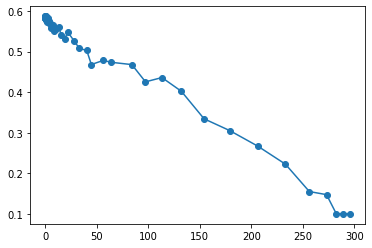

In [71]:
sse_list = []
for n in range(len(quantizations)):
    print('q=',quantizations[n])
    sse = np.sum(np.concatenate([(x - y).numpy().ravel() for (x,y) in zip(mrrs_and_bitlengths_baseline[n,-1], uncompressed_list)])**2)
    print('uniform的SSE', sse)
    print('uniform的acc', mrrs_and_bitlengths_baseline[n,0])
    sse_list.append(sse)
plt.plot(sse_list, mrrs_and_bitlengths_baseline[:,0], '-o')
plt.show()

In [ ]:
from matplotlib.ticker import AutoMinorLocator
plt.figure(figsize=(8, 6), dpi=300)
full_acc = diagnostics_uncpr_val
plt.axhline(full_acc, linestyle=':', color='#666666', label='uncompressed model')

num_dimensions = len(whole_w)

plt.plot(
    mrrs_and_bitlengths_list[0][:, 5] / num_dimensions,
    mrrs_and_bitlengths_list[0][:, 0],
    '-', label='VBQ+add(Gaussian)', c='#d95f02')

plt.plot(
    mrrs_and_bitlengths_list[1][:, 5] / num_dimensions,
    mrrs_and_bitlengths_list[1][:, 0],
    '-', label='VBQ+add(gg)')

plt.plot(
    mrrs_and_bitlengths_list[2][:, 5] / num_dimensions,
    mrrs_and_bitlengths_list[2][:, 0],
    '-', label='VBQ+add(GMM)')

plt.plot(
    mrrs_and_bitlengths_list[3][:, 5] / num_dimensions,
    mrrs_and_bitlengths_list[3][:, 0],
    '-', label='VBQ+add(Cauchy)')

plt.plot(
    mrrs_and_bitlengths_list[0][:, 1] / num_dimensions,
    mrrs_and_bitlengths_list[0][:, 0],
    '-', label='VBQ+AC(Gaussian)')

plt.plot(
    mrrs_and_bitlengths_list[1][:, 1] / num_dimensions,
    mrrs_and_bitlengths_list[1][:, 0],
    '-', label='VBQ+AC(gg)')

plt.plot(
    mrrs_and_bitlengths_list[2][:, 1] / num_dimensions,
    mrrs_and_bitlengths_list[2][:, 0],
    '-', label='VBQ+AC(GMM)')

plt.plot(
    mrrs_and_bitlengths_list[3][:, 1] / num_dimensions,
    mrrs_and_bitlengths_list[3][:, 0],
    '-', label='VBQ+AC(Cauchy)')

plt.plot(
    mrrs_and_bitlengths_baseline[:, -4] / num_dimensions,
    mrrs_and_bitlengths_baseline[:, 0],
    '-', label='uniform quant.~+ AC', c='#7570b3')


plt.plot(
    mrrs_and_bitlengths_baseline[:, -1] / num_dimensions,
    mrrs_and_bitlengths_baseline[:, 0],
    '--', label='uniform quant.~+ lzma',  c='#66a61e')

plt.plot(
    mrrs_and_bitlengths_baseline[:, -2] / num_dimensions,
    mrrs_and_bitlengths_baseline[:, 0],
    '-.', label='uniform quant.~+ bzip2',  c='#e7298a')

plt.plot(
    mrrs_and_bitlengths_baseline[:, -3] / num_dimensions,
    mrrs_and_bitlengths_baseline[:, 0],
     ':', label='uniform quant.~+ gzip', c='#1b9e77')

plt.xlim(-0.2, 10)
plt.xlabel('bits per latent dimension')
plt.ylabel('accuracy')
lgd = plt.legend(loc='upper left', bbox_to_anchor=(1.02, 1.04), labelspacing=0.5, handlelength=2.2)
plt.savefig('../results/figure/{}_{}_acc_bits.png'.format(dataset, strategy))